<a href="https://colab.research.google.com/github/IsaacFigNewton/Analyzing-Hate-Crime-Data/blob/main/Hate_Crime_Data_Exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#TODO:
####Get p-values for different correlation coefficients in merged_df
####Extract county-by-county hate crime frequency data

#Import Stuff

###Import all libraries

In [1]:
import pandas as pd
import sklearn as sk
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import altair as alt
import re

###Import datasets

In [2]:
crime_df = pd.read_csv("https://raw.githubusercontent.com/IsaacFigNewton/Analyzing-Hate-Crime-Data/main/hate_crime/hate_crime.csv", on_bad_lines='skip')
city_demo_df = pd.read_csv("https://raw.githubusercontent.com/IsaacFigNewton/Analyzing-Hate-Crime-Data/main/demographics/city/ACSST1Y2022.S0101-Data.csv", on_bad_lines='skip')
county_demo_df = pd.read_csv("https://raw.githubusercontent.com/IsaacFigNewton/Analyzing-Hate-Crime-Data/main/demographics/county/ACSDP1Y2022.DP05-Data.csv", on_bad_lines='skip')

In [3]:
ethnicity_race_cols = list(set(pd.read_csv("https://raw.githubusercontent.com/IsaacFigNewton/Analyzing-Hate-Crime-Data/main/demographics/county/ethnicity_race_col_names", sep=";")["Percent!!RACE!!One race"]))
# ethnicity_race_cols

#Data Cleaning

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
#only consider 2022 crime data from cities and counties
crime_df = crime_df[(crime_df['data_year'] == 2022) & ((crime_df['agency_type_name'] == "County") | (crime_df['agency_type_name'] == "City"))]

##Clean city and county demographic datasets

In [6]:
# use the entries of the first row as the column headers for easier management
def fixHeaders(df):
  new_headers = df.iloc[0]
  new_df = df[1:]
  new_df.columns = new_headers
  return new_df

In [7]:
#fix the headers
city_demo_df = fixHeaders(city_demo_df)
county_demo_df = fixHeaders(county_demo_df)

###Create area columns

In [8]:
def split_area_name(area):
    result = [np.nan, np.nan, np.nan]
    if ", " in area:
        result = area.split(", ") + [np.nan]
    if " city" in result[0].lower():
        result[0] = result[0][0:-5]
        result[2] = result[1]
        result[1] = "City"
    elif " county" in result[0].lower():
        result[0] = result[0][0:-7]
        result[2] = result[1]
        result[1] = "County"

    return result + [np.nan] * (3 - len(result))

def splitArea(df):
    df[["pug_agency_name", "agency_type_name", "state_name"]] = df["Geographic Area Name"].map(split_area_name).apply(pd.Series)

In [9]:
splitArea(city_demo_df)
splitArea(county_demo_df)

# city_demo_df.head()

###Fix column names



In [10]:
def fix_column_names(df):
  removalList = {"SEX AND AGE!!", "SEX AND ", "Estimate!!", "Total!!", "Total population!!", "CITIZEN, VOTING AGE POPULATION!!", "AGE!!"}

  new_cols = []
  for col in df.columns:
    col = str(col)
    for term in removalList:
      if term in col:
        col = col.replace(term, "")
    new_cols.append(col)

  return new_cols

county_demo_df.columns = fix_column_names(county_demo_df)
city_demo_df.columns = fix_column_names(city_demo_df)

###Add and remove columns to line the dataframes up

In [11]:
#combine the city_df age-related columns as needed to merge better with the county_demo_df
def combine_city_df_cols(df_s0101):
    formatted_df = df_s0101.copy(deep=True)

    formatted_df['25 to 34 years'] = df_s0101['25 to 29 years'] + df_s0101['30 to 34 years']
    formatted_df['35 to 44 years'] = df_s0101['35 to 39 years'] + df_s0101['40 to 44 years']
    formatted_df['45 to 54 years'] = df_s0101['45 to 49 years'] + df_s0101['50 to 54 years']
    formatted_df['65 to 74 years'] = df_s0101['65 to 69 years'] + df_s0101['70 to 74 years']
    formatted_df['75 to 84 years'] = df_s0101['75 to 79 years'] + df_s0101['80 to 84 years']

    return formatted_df

city_demo_df = combine_city_df_cols(city_demo_df)
# city_demo_df

In [12]:
# fix any missing values
city_demo_df = city_demo_df.replace("(X)", np.nan)
county_demo_df = county_demo_df.replace("(X)", np.nan)

In [13]:
#drop all margin of error columns from the city and county dataframes
def drop_cols_containing(df, pattern):
    df.drop(columns=list(df.filter(regex = pattern)), inplace = True)

drop_cols_containing(city_demo_df, "Margin of Error|SUMMARY INDICATORS|PERCENT ALLOCATED|SELECTED AGE CATEGORIES|Female")
drop_cols_containing(county_demo_df, "Margin of Error|SUMMARY INDICATORS|PERCENT ALLOCATED")

# city_demo_df.dtypes

###Fix column data types

In [14]:
counts = county_demo_df.columns.value_counts()
mask = counts > 1
duplicates = list(counts[mask].index)
county_demo_df[duplicates].dtypes

65 years and over                   object
65 years and over                   object
18 years and over                   object
18 years and over                   object
Percent!!65 years and over          object
Percent!!65 years and over          object
Percent!!RACE!!One race             object
Percent!!RACE!!One race             object
Percent!!RACE!!Two or More Races    object
Percent!!RACE!!Two or More Races    object
Percent!!18 years and over          object
Percent!!18 years and over          object
RACE!!One race                      object
RACE!!One race                      object
RACE!!Two or More Races             object
RACE!!Two or More Races             object
dtype: object

In [15]:
county_demo_df = county_demo_df.loc[:, ~county_demo_df.columns.duplicated(keep='last')]

In [16]:
city_percent_age_cols = list(set(list(city_demo_df.filter(regex = "Percent")) + list(city_demo_df.filter(regex = "ratio")) + list(city_demo_df.filter(regex = "years"))))
county_percent_age_cols = list(set(list(county_demo_df.filter(regex = "Percent")) + list(county_demo_df.filter(regex = "ratio")) + list(county_demo_df.filter(regex = "years"))))

for column in city_percent_age_cols:
    city_demo_df = city_demo_df[~city_demo_df[column].astype(str).str.contains('N')]

for column in county_percent_age_cols:
    county_demo_df = county_demo_df[~county_demo_df[column].astype(str).str.contains('N')]

In [17]:
city_demo_df[city_percent_age_cols] = city_demo_df[city_percent_age_cols].astype(float)
county_demo_df[county_percent_age_cols] = county_demo_df[county_percent_age_cols].astype(float)

In [18]:
county_demo_df[ethnicity_race_cols] = county_demo_df[ethnicity_race_cols].astype(float)

In [19]:
# Convert the quantitative columns to int types
# continuous quantitative variables
continuous_int_columns = ["Total population", "Under 5 years", "5 to 9 years", "45 to 54 years", "10 to 14 years", "75 to 84 years", "60 to 64 years",\
                      "25 to 34 years", "15 to 19 years", "20 to 24 years", "35 to 44 years", "55 to 59 years", "65 to 74 years",\
                      "85 years and over"] #+ list(city_demo_df.filter(regex = "Total population"))

for column in continuous_int_columns:
    city_demo_df = city_demo_df[~city_demo_df[column].astype(str).str.contains('N')]
    county_demo_df = county_demo_df[~county_demo_df[column].astype(str).str.contains('N')]

city_demo_df[continuous_int_columns] = city_demo_df[continuous_int_columns].astype(int)
county_demo_df[continuous_int_columns] = county_demo_df[continuous_int_columns].astype(int)

In [20]:
age_groups = ['Under 5 years', '5 to 9 years', '10 to 14 years', '15 to 19 years', '20 to 24 years', '25 to 34 years', '35 to 44 years', '45 to 54 years', '55 to 59 years', '60 to 64 years', '65 to 74 years', '75 to 84 years', '85 years and over']

###Drop more invalid data

In [21]:
# city_demo_df.head()

In [22]:
# for group in age_groups:
#     city_demo_df = city_demo_df[city_demo_df[group] < 10**7]
#     county_demo_df = county_demo_df[county_demo_df[group] < 10**7]

# city_demo_df.head()

##Clean crime dataset

###Break up incident date information

In [23]:
def split_incident_date(date):
    result = date.split("-")

    return result + [np.nan] * (3 - len(result))

crime_df[["data_year", "incident_month", "incident_day"]] = crime_df["incident_date"]\
                                                              .map(split_incident_date)\
                                                              .apply(pd.Series)\
                                                              .astype(int)

In [24]:
crime_df[["data_year", "incident_month", "incident_day"]].dtypes

data_year         int64
incident_month    int64
incident_day      int64
dtype: object

###Break up crime_df categorical columns containing multiple categories into dummies

In [25]:
def multicol_parse(df, column, delimiter):
  prefix = column + "_"

  dummies = df[column]\
              .str\
              .get_dummies(sep=delimiter)\
              .add_prefix(prefix)
  dummies = dummies.astype(int)
  dummies.head()

  dummy_cols = list(dummies.columns)
  unique_values = [val.replace(prefix, "") for val in dummy_cols]

  # combine the dataframes
  new_df = pd.concat([df, dummies], axis=1)

  return unique_values, dummy_cols, new_df#, list(cols_map.values())

In [26]:
crime_df.reset_index(inplace=True)

In [27]:
#Break up bias_desc column into dummy columns
unique_biases, bias_cols, crime_df = multicol_parse(crime_df, "bias_desc", ";")

In [28]:
#Break up victim_types column into dummy columns
unique_victim_types, victim_cols, crime_df = multicol_parse(crime_df, "victim_types", ";")

In [29]:
#Break up offense_names column into dummy columns
unique_offense_names, offense_cols, crime_df = multicol_parse(crime_df, "offense_name", ";")

In [30]:
#Break up location_names column into dummy columns
unique_location_names, location_cols, crime_df = multicol_parse(crime_df, "location_name", ";")

###Create dummy columns for other categorical variables

In [31]:
other_categorical_cols = ["agency_type_name", "division_name", "offender_race", "offender_ethnicity",
                            "state_name", "multiple_offense", "multiple_bias"]

In [32]:
other_unique_categorical_col_vals = {}
for col in other_categorical_cols:
    other_unique_categorical_col_vals[col] = crime_df[col].unique()


In [33]:
dummies = pd.get_dummies(crime_df[other_categorical_cols]).astype(int)
dummies.drop(columns=['multiple_offense_S', 'multiple_bias_S'], inplace=True)

other_categorical_cols = dummies.columns

# combine the dummy columns with crime_df
crime_df = pd.concat([crime_df, dummies], axis=1)

###Verify data quality

In [34]:
crime_df.head()

,index,incident_id,data_year,ori,pug_agency_name,pub_agency_unit,agency_type_name,state_abbr,state_name,division_name,region_name,population_group_code,population_group_description,incident_date,adult_victim_count,juvenile_victim_count,total_offender_count,adult_offender_count,juvenile_offender_count,offender_race,offender_ethnicity,victim_count,offense_name,total_individual_victims,location_name,bias_desc,victim_types,multiple_offense,multiple_bias,incident_month,incident_day,bias_desc_Anti-American Indian or Alaska Native,bias_desc_Anti-Arab,bias_desc_Anti-Asian,bias_desc_Anti-Atheism/Agnosticism,bias_desc_Anti-Bisexual,bias_desc_Anti-Black or African American,bias_desc_Anti-Buddhist,bias_desc_Anti-Catholic,bias_desc_Anti-Church of Jesus Christ,"bias_desc_Anti-Eastern Orthodox (Russian, Greek, Other)",bias_desc_Anti-Female,bias_desc_Anti-Gay (Male),bias_desc_Anti-Gender Non-Conforming,bias_desc_Anti-Heterosexual,bias_desc_Anti-Hindu,bias_desc_Anti-Hispanic or Latino,bias_desc_Anti-Islamic (Muslim),bias_desc_Anti-Jehovah's Witness,bias_desc_Anti-Jewish,bias_desc_Anti-Lesbian (Female),"bias_desc_Anti-Lesbian, Gay, Bisexual, or Transgender (Mixed Group)",bias_desc_Anti-Male,bias_desc_Anti-Mental Disability,"bias_desc_Anti-Multiple Races, Group","bias_desc_Anti-Multiple Religions, Group",bias_desc_Anti-Native Hawaiian or Other Pacific Islander,bias_desc_Anti-Other Christian,bias_desc_Anti-Other Race/Ethnicity/Ancestry,bias_desc_Anti-Other Religion,bias_desc_Anti-Physical Disability,bias_desc_Anti-Protestant,bias_desc_Anti-Sikh,bias_desc_Anti-Transgender,bias_desc_Anti-White,victim_types_Business,victim_types_Financial Institution,victim_types_Government,victim_types_Individual,victim_types_Law Enforcement Officer,victim_types_Other,victim_types_Religious Organization,victim_types_Society/Public,victim_types_Unknown,offense_name_Aggravated Assault,offense_name_All Other Larceny,offense_name_Animal Cruelty,offense_name_Arson,offense_name_Assisting or Promoting Prostitution,offense_name_Burglary/Breaking & Entering,offense_name_Counterfeiting/Forgery,offense_name_Credit Card/Automated Teller Machine Fraud,offense_name_Destruction/Damage/Vandalism of Property,offense_name_Drug Equipment Violations,offense_name_Drug/Narcotic Violations,offense_name_Embezzlement,offense_name_Extortion/Blackmail,offense_name_False Pretenses/Swindle/Confidence Game,offense_name_Fondling,"offense_name_Human Trafficking, Commercial Sex Acts","offense_name_Human Trafficking, Involuntary Servitude",offense_name_Identity Theft,offense_name_Impersonation,offense_name_Intimidation,offense_name_Kidnapping/Abduction,offense_name_Motor Vehicle Theft,offense_name_Murder and Nonnegligent Manslaughter,offense_name_Not Specified,offense_name_Operating/Promoting/Assisting Gambling,offense_name_Pocket-picking,offense_name_Pornography/Obscene Material,offense_name_Prostitution,offense_name_Purse-snatching,offense_name_Rape,offense_name_Robbery,offense_name_Sexual Assault With An Object,offense_name_Shoplifting,offense_name_Simple Assault,offense_name_Sodomy,offense_name_Statutory Rape,offense_name_Stolen Property Offenses,offense_name_Theft From Building,offense_name_Theft From Coin-Operated Machine or Device,offense_name_Theft From Motor Vehicle,offense_name_Theft of Motor Vehicle Parts or Accessories,offense_name_Weapon Law Violations,offense_name_Wire Fraud,location_name_ATM Separate from Bank,location_name_Abandoned/Condemned Structure,location_name_Air/Bus/Train Terminal,location_name_Amusement Park,location_name_Arena/Stadium/Fairgrounds/Coliseum,location_name_Auto Dealership New/Used,location_name_Bank/Savings and Loan,location_name_Bar/Nightclub,location_name_Camp/Campground,location_name_Church/Synagogue/Temple/Mosque,location_name_Commercial/Office Building,location_name_Community Center,location_name_Construction Site,location_name_Convenience Store,location_name_Cyberspace,location_name_Daycare Facility,location_name_Department/Discount Store,location_name_D

In [35]:
crime_df.dtypes

index                                                                    int64
incident_id                                                              int64
data_year                                                                int64
ori                                                                     object
pug_agency_name                                                         object
pub_agency_unit                                                         object
agency_type_name                                                        object
state_abbr                                                              object
state_name                                                              object
division_name                                                           object
region_name                                                             object
population_group_code                                                   object
population_group_description                        

##Merge the datasets

In [36]:
'Percent!!RACE!!One race!!White' in county_demo_df.columns

True

In [37]:
# Create new columns that combine data shared between all the city and county entries
overlapping_columns = set(city_demo_df.columns).intersection(set(county_demo_df.columns))

# include overlapping data and race and ethnicity data from the county dataset
print(overlapping_columns.union(ethnicity_race_cols))
demo_df = pd.concat([city_demo_df[list(overlapping_columns)], county_demo_df[list(overlapping_columns)]])
demo_df = demo_df.merge(
    right=county_demo_df[ethnicity_race_cols + ["pug_agency_name"]],
    on="pug_agency_name",
    how="outer"
    )

{'Under 5 years', 'Percent!!HISPANIC OR LATINO AND RACE!!Hispanic or Latino (of any race)!!Mexican', 'Percent!!HISPANIC OR LATINO AND RACE!!Not Hispanic or Latino!!Two or More Races', 'Percent!!HISPANIC OR LATINO AND RACE!!Not Hispanic or Latino!!Asian alone', 'Percent!!Race alone or in combination with one or more other races!!American Indian and Alaska Native', 'Percent!!RACE!!Two or More Races!!White and Some Other Race', 'Percent!!RACE!!One race!!Asian!!Chinese', 'Percent!!Citizen, 18 and over population', 'Percent!!20 to 24 years', 'Percent!!55 to 59 years', 'Percent!!HISPANIC OR LATINO AND RACE!!Hispanic or Latino (of any race)!!Cuban', 'agency_type_name', 'Percent!!RACE!!One race!!Asian!!Japanese', '85 years and over', '25 to 34 years', 'Percent!!HISPANIC OR LATINO AND RACE!!Total population', 'Percent!!RACE!!One race!!Black or African American', 'Percent!!RACE!!One race!!Native Hawaiian and Other Pacific Islander!!Native Hawaiian', 'Percent!!RACE!!One race!!Asian!!Other Asian',

In [38]:
# combine the crime and population datasets
merged_df = pd.merge(crime_df, demo_df, on=["pug_agency_name", "agency_type_name", "state_name"])

##Clean the merged dataset

In [39]:
merged_df.drop(["ori", "state_abbr", "population_group_code", "pub_agency_unit",
                "Geography", "Percent!!Total population", "population_group_description",
                "Geographic Area Name", "incident_date", "pub_agency_unit", "pug_agency_name",
                "agency_type_name", "state_name", "division_name", "offender_race", "offender_ethnicity",
                "location_name", "bias_desc", "victim_types", "multiple_offense",
                  "multiple_bias"], axis=1, inplace=True)

# include offense_name in categorical data once you've refactored multicol parsing

In [40]:
# categorical variables
binary_int_columns = bias_cols + victim_cols + offense_cols + location_cols + list(other_categorical_cols)
int_columns = continuous_int_columns + binary_int_columns + ["incident_month", "incident_day"]

In [41]:
print(int_columns)

['Total population', 'Under 5 years', '5 to 9 years', '45 to 54 years', '10 to 14 years', '75 to 84 years', '60 to 64 years', '25 to 34 years', '15 to 19 years', '20 to 24 years', '35 to 44 years', '55 to 59 years', '65 to 74 years', '85 years and over', 'bias_desc_Anti-American Indian or Alaska Native', 'bias_desc_Anti-Arab', 'bias_desc_Anti-Asian', 'bias_desc_Anti-Atheism/Agnosticism', 'bias_desc_Anti-Bisexual', 'bias_desc_Anti-Black or African American', 'bias_desc_Anti-Buddhist', 'bias_desc_Anti-Catholic', 'bias_desc_Anti-Church of Jesus Christ', 'bias_desc_Anti-Eastern Orthodox (Russian, Greek, Other)', 'bias_desc_Anti-Female', 'bias_desc_Anti-Gay (Male)', 'bias_desc_Anti-Gender Non-Conforming', 'bias_desc_Anti-Heterosexual', 'bias_desc_Anti-Hindu', 'bias_desc_Anti-Hispanic or Latino', 'bias_desc_Anti-Islamic (Muslim)', "bias_desc_Anti-Jehovah's Witness", 'bias_desc_Anti-Jewish', 'bias_desc_Anti-Lesbian (Female)', 'bias_desc_Anti-Lesbian, Gay, Bisexual, or Transgender (Mixed Group

#Extract Additional Features

In [42]:
def get_col_counts(df, unique_cols):
    # get the frequencies of categorical data based
    unique_col_counts = {}
    for value in unique_cols:
        unique_col_counts[value] = df[value].sum()

    return unique_col_counts

##Get hate crime rate per state

In [43]:
merged_df.head()

,index,incident_id,data_year,region_name,adult_victim_count,juvenile_victim_count,total_offender_count,adult_offender_count,juvenile_offender_count,victim_count,offense_name,total_individual_victims,incident_month,incident_day,bias_desc_Anti-American Indian or Alaska Native,bias_desc_Anti-Arab,bias_desc_Anti-Asian,bias_desc_Anti-Atheism/Agnosticism,bias_desc_Anti-Bisexual,bias_desc_Anti-Black or African American,bias_desc_Anti-Buddhist,bias_desc_Anti-Catholic,bias_desc_Anti-Church of Jesus Christ,"bias_desc_Anti-Eastern Orthodox (Russian, Greek, Other)",bias_desc_Anti-Female,bias_desc_Anti-Gay (Male),bias_desc_Anti-Gender Non-Conforming,bias_desc_Anti-Heterosexual,bias_desc_Anti-Hindu,bias_desc_Anti-Hispanic or Latino,bias_desc_Anti-Islamic (Muslim),bias_desc_Anti-Jehovah's Witness,bias_desc_Anti-Jewish,bias_desc_Anti-Lesbian (Female),"bias_desc_Anti-Lesbian, Gay, Bisexual, or Transgender (Mixed Group)",bias_desc_Anti-Male,bias_desc_Anti-Mental Disability,"bias_desc_Anti-Multiple Races, Group","bias_desc_Anti-Multiple Religions, Group",bias_desc_Anti-Native Hawaiian or Other Pacific Islander,bias_desc_Anti-Other Christian,bias_desc_Anti-Other Race/Ethnicity/Ancestry,bias_desc_Anti-Other Religion,bias_desc_Anti-Physical Disability,bias_desc_Anti-Protestant,bias_desc_Anti-Sikh,bias_desc_Anti-Transgender,bias_desc_Anti-White,victim_types_Business,victim_types_Financial Institution,victim_types_Government,victim_types_Individual,victim_types_Law Enforcement Officer,victim_types_Other,victim_types_Religious Organization,victim_types_Society/Public,victim_types_Unknown,offense_name_Aggravated Assault,offense_name_All Other Larceny,offense_name_Animal Cruelty,offense_name_Arson,offense_name_Assisting or Promoting Prostitution,offense_name_Burglary/Breaking & Entering,offense_name_Counterfeiting/Forgery,offense_name_Credit Card/Automated Teller Machine Fraud,offense_name_Destruction/Damage/Vandalism of Property,offense_name_Drug Equipment Violations,offense_name_Drug/Narcotic Violations,offense_name_Embezzlement,offense_name_Extortion/Blackmail,offense_name_False Pretenses/Swindle/Confidence Game,offense_name_Fondling,"offense_name_Human Trafficking, Commercial Sex Acts","offense_name_Human Trafficking, Involuntary Servitude",offense_name_Identity Theft,offense_name_Impersonation,offense_name_Intimidation,offense_name_Kidnapping/Abduction,offense_name_Motor Vehicle Theft,offense_name_Murder and Nonnegligent Manslaughter,offense_name_Not Specified,offense_name_Operating/Promoting/Assisting Gambling,offense_name_Pocket-picking,offense_name_Pornography/Obscene Material,offense_name_Prostitution,offense_name_Purse-snatching,offense_name_Rape,offense_name_Robbery,offense_name_Sexual Assault With An Object,offense_name_Shoplifting,offense_name_Simple Assault,offense_name_Sodomy,offense_name_Statutory Rape,offense_name_Stolen Property Offenses,offense_name_Theft From Building,offense_name_Theft From Coin-Operated Machine or Device,offense_name_Theft From Motor Vehicle,offense_name_Theft of Motor Vehicle Parts or Accessories,offense_name_Weapon Law Violations,offense_name_Wire Fraud,location_name_ATM Separate from Bank,location_name_Abandoned/Condemned Structure,location_name_Air/Bus/Train Terminal,location_name_Amusement Park,location_name_Arena/Stadium/Fairgrounds/Coliseum,location_name_Auto Dealership New/Used,location_name_Bank/Savings and Loan,location_name_Bar/Nightclub,location_name_Camp/Campground,location_name_Church/Synagogue/Temple/Mosque,location_name_Commercial/Office Building,location_name_Community Center,location_name_Construction Site,location_name_Convenience Store,location_name_Cyberspace,location_name_Daycare Facility,location_name_Department/Discount Store,location_name_Dock/Wharf/Freight/Modal Terminal,location_name_Drug Store/Doctor's Office/Hospital,location_name_Farm Facility,location_name_Field/Woods,location_name_Gambling Facility/Casino/Race Track,location_name_Government/Public Building,location_name_Grocery/Super

In [44]:
for i in range(len(other_unique_categorical_col_vals["state_name"])):
  other_unique_categorical_col_vals["state_name"][i] = "state_name_" + other_unique_categorical_col_vals["state_name"][i]

other_unique_categorical_col_vals["state_name"]

array(['state_name_Alaska', 'state_name_Alabama', 'state_name_Arkansas',
       'state_name_Arizona', 'state_name_California',
       'state_name_Colorado', 'state_name_Connecticut',
       'state_name_District of Columbia', 'state_name_Delaware',
       'state_name_Florida', 'state_name_Georgia', 'state_name_Hawaii',
       'state_name_Iowa', 'state_name_Idaho', 'state_name_Illinois',
       'state_name_Indiana', 'state_name_Kansas', 'state_name_Kentucky',
       'state_name_Louisiana', 'state_name_Massachusetts',
       'state_name_Maryland', 'state_name_Maine', 'state_name_Michigan',
       'state_name_Minnesota', 'state_name_Missouri',
       'state_name_Mississippi', 'state_name_Montana',
       'state_name_Nebraska', 'state_name_North Carolina',
       'state_name_North Dakota', 'state_name_New Hampshire',
       'state_name_New Jersey', 'state_name_New Mexico',
       'state_name_Nevada', 'state_name_New York', 'state_name_Ohio',
       'state_name_Oklahoma', 'state_name_Oregon'

In [45]:
state_hate_frequencies = get_col_counts(crime_df, other_unique_categorical_col_vals["state_name"])
state_hate_frequencies

{'state_name_Alaska': 5,
 'state_name_Alabama': 224,
 'state_name_Arkansas': 33,
 'state_name_Arizona': 199,
 'state_name_California': 1992,
 'state_name_Colorado': 312,
 'state_name_Connecticut': 78,
 'state_name_District of Columbia': 125,
 'state_name_Delaware': 6,
 'state_name_Florida': 150,
 'state_name_Georgia': 169,
 'state_name_Hawaii': 32,
 'state_name_Iowa': 66,
 'state_name_Idaho': 36,
 'state_name_Illinois': 312,
 'state_name_Indiana': 155,
 'state_name_Kansas': 116,
 'state_name_Kentucky': 114,
 'state_name_Louisiana': 62,
 'state_name_Massachusetts': 413,
 'state_name_Maryland': 168,
 'state_name_Maine': 79,
 'state_name_Michigan': 363,
 'state_name_Minnesota': 164,
 'state_name_Missouri': 190,
 'state_name_Mississippi': 28,
 'state_name_Montana': 12,
 'state_name_Nebraska': 57,
 'state_name_North Carolina': 302,
 'state_name_North Dakota': 17,
 'state_name_New Hampshire': 25,
 'state_name_New Jersey': 1036,
 'state_name_New Mexico': 36,
 'state_name_Nevada': 85,
 'state_

# Data Exploration

##Individual Datasets

###Hate Crime Dataset

In [46]:
crime_df.head()

,index,incident_id,data_year,ori,pug_agency_name,pub_agency_unit,agency_type_name,state_abbr,state_name,division_name,region_name,population_group_code,population_group_description,incident_date,adult_victim_count,juvenile_victim_count,total_offender_count,adult_offender_count,juvenile_offender_count,offender_race,offender_ethnicity,victim_count,offense_name,total_individual_victims,location_name,bias_desc,victim_types,multiple_offense,multiple_bias,incident_month,incident_day,bias_desc_Anti-American Indian or Alaska Native,bias_desc_Anti-Arab,bias_desc_Anti-Asian,bias_desc_Anti-Atheism/Agnosticism,bias_desc_Anti-Bisexual,bias_desc_Anti-Black or African American,bias_desc_Anti-Buddhist,bias_desc_Anti-Catholic,bias_desc_Anti-Church of Jesus Christ,"bias_desc_Anti-Eastern Orthodox (Russian, Greek, Other)",bias_desc_Anti-Female,bias_desc_Anti-Gay (Male),bias_desc_Anti-Gender Non-Conforming,bias_desc_Anti-Heterosexual,bias_desc_Anti-Hindu,bias_desc_Anti-Hispanic or Latino,bias_desc_Anti-Islamic (Muslim),bias_desc_Anti-Jehovah's Witness,bias_desc_Anti-Jewish,bias_desc_Anti-Lesbian (Female),"bias_desc_Anti-Lesbian, Gay, Bisexual, or Transgender (Mixed Group)",bias_desc_Anti-Male,bias_desc_Anti-Mental Disability,"bias_desc_Anti-Multiple Races, Group","bias_desc_Anti-Multiple Religions, Group",bias_desc_Anti-Native Hawaiian or Other Pacific Islander,bias_desc_Anti-Other Christian,bias_desc_Anti-Other Race/Ethnicity/Ancestry,bias_desc_Anti-Other Religion,bias_desc_Anti-Physical Disability,bias_desc_Anti-Protestant,bias_desc_Anti-Sikh,bias_desc_Anti-Transgender,bias_desc_Anti-White,victim_types_Business,victim_types_Financial Institution,victim_types_Government,victim_types_Individual,victim_types_Law Enforcement Officer,victim_types_Other,victim_types_Religious Organization,victim_types_Society/Public,victim_types_Unknown,offense_name_Aggravated Assault,offense_name_All Other Larceny,offense_name_Animal Cruelty,offense_name_Arson,offense_name_Assisting or Promoting Prostitution,offense_name_Burglary/Breaking & Entering,offense_name_Counterfeiting/Forgery,offense_name_Credit Card/Automated Teller Machine Fraud,offense_name_Destruction/Damage/Vandalism of Property,offense_name_Drug Equipment Violations,offense_name_Drug/Narcotic Violations,offense_name_Embezzlement,offense_name_Extortion/Blackmail,offense_name_False Pretenses/Swindle/Confidence Game,offense_name_Fondling,"offense_name_Human Trafficking, Commercial Sex Acts","offense_name_Human Trafficking, Involuntary Servitude",offense_name_Identity Theft,offense_name_Impersonation,offense_name_Intimidation,offense_name_Kidnapping/Abduction,offense_name_Motor Vehicle Theft,offense_name_Murder and Nonnegligent Manslaughter,offense_name_Not Specified,offense_name_Operating/Promoting/Assisting Gambling,offense_name_Pocket-picking,offense_name_Pornography/Obscene Material,offense_name_Prostitution,offense_name_Purse-snatching,offense_name_Rape,offense_name_Robbery,offense_name_Sexual Assault With An Object,offense_name_Shoplifting,offense_name_Simple Assault,offense_name_Sodomy,offense_name_Statutory Rape,offense_name_Stolen Property Offenses,offense_name_Theft From Building,offense_name_Theft From Coin-Operated Machine or Device,offense_name_Theft From Motor Vehicle,offense_name_Theft of Motor Vehicle Parts or Accessories,offense_name_Weapon Law Violations,offense_name_Wire Fraud,location_name_ATM Separate from Bank,location_name_Abandoned/Condemned Structure,location_name_Air/Bus/Train Terminal,location_name_Amusement Park,location_name_Arena/Stadium/Fairgrounds/Coliseum,location_name_Auto Dealership New/Used,location_name_Bank/Savings and Loan,location_name_Bar/Nightclub,location_name_Camp/Campground,location_name_Church/Synagogue/Temple/Mosque,location_name_Commercial/Office Building,location_name_Community Center,location_name_Construction Site,location_name_Convenience Store,location_name_Cyberspace,location_name_Daycare Facility,location_name_Department/Discount Store,location_name_D

####Quantitative variable figures

<Axes: title={'center': 'total_offender_count'}, ylabel='Frequency'>

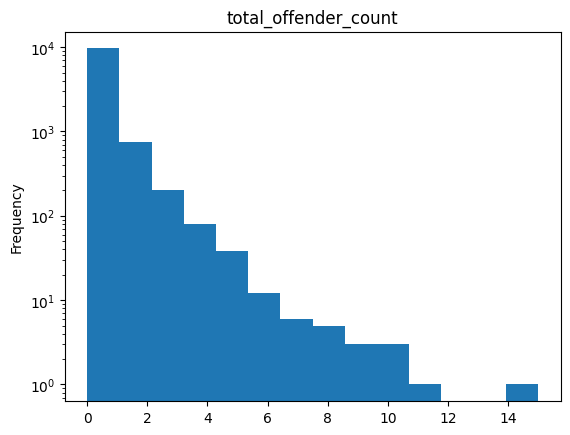

In [47]:
crime_df['total_offender_count'].plot.hist(bins=14, title='total_offender_count', logy=True)

<Axes: title={'center': 'adult_victim_count'}, ylabel='Frequency'>

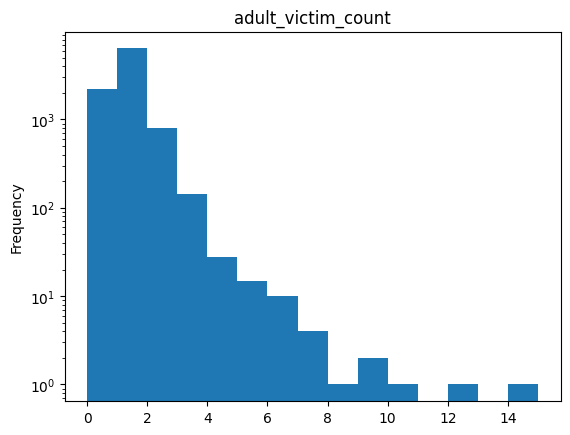

In [48]:
crime_df['adult_victim_count'].plot.hist(bins=15, title='adult_victim_count', logy=True)

<Axes: title={'center': 'juvenile_victim_count'}, ylabel='Frequency'>

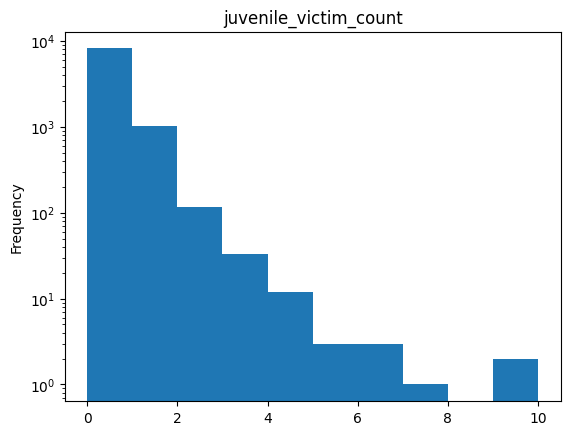

In [49]:
crime_df['juvenile_victim_count'].plot.hist(bins=10, title='juvenile_victim_count', logy=True)

####Categorical variable figures


In [50]:
def plot_column_counts(df, column_name, unique_values, title_phrase, figsize=(20, 5), rotation=90):
    # Create a dictionary of unique values and their counts
    unique_value_counts = get_col_counts(df, unique_values)

    # Sort the dictionary by values in descending order
    sorted_value_counts = dict(sorted(unique_value_counts.items(), key=lambda item: item[1], reverse=True))

    # Create a bar chart of the sorted valuees and their counts
    plt.figure(figsize=figsize)
    sns.barplot(x=list(sorted_value_counts.keys()), y=list(sorted_value_counts.values()), log=True)

    # Set the title and labels
    plt.title("Frequency of " + title_phrase + " in Hate Crimes", fontsize=16)
    plt.xlabel(title_phrase, fontsize=14)
    plt.ylabel("Frequency (Log Scale)", fontsize=14)

    # Rotate the x-axis labels for readability
    plt.xticks(rotation=rotation)

    # Show the plot
    plt.show()


(array([0, 1, 2, 3]),
 [Text(0, 0, 'West'),
  Text(1, 0, 'Northeast'),
  Text(2, 0, 'South'),
  Text(3, 0, 'Midwest')])

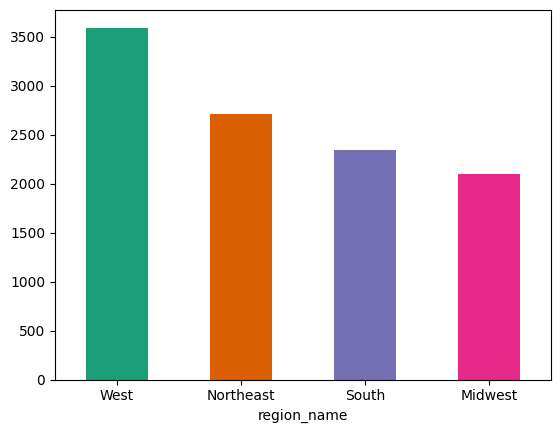

In [51]:
crime_df.groupby('region_name').size().sort_values(ascending=False).plot.bar(color=sns.palettes.mpl_palette('Dark2'))
plt.xticks(rotation=0)

(array([0, 1]), [Text(0, 0, 'City'), Text(1, 0, 'County')])

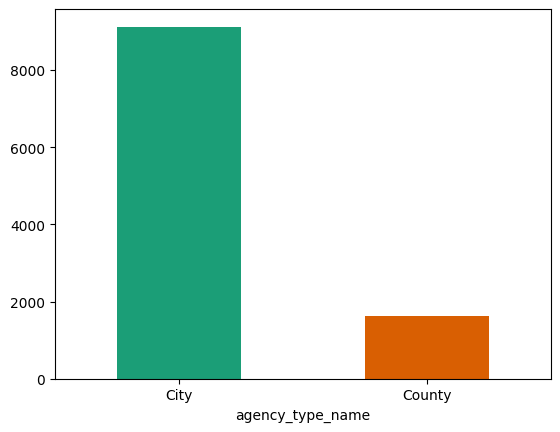

In [52]:
crime_df.groupby('agency_type_name').size().sort_values(ascending=False).plot.bar(color=sns.palettes.mpl_palette('Dark2'))
plt.xticks(rotation=0)

<Axes: ylabel='offender_race'>

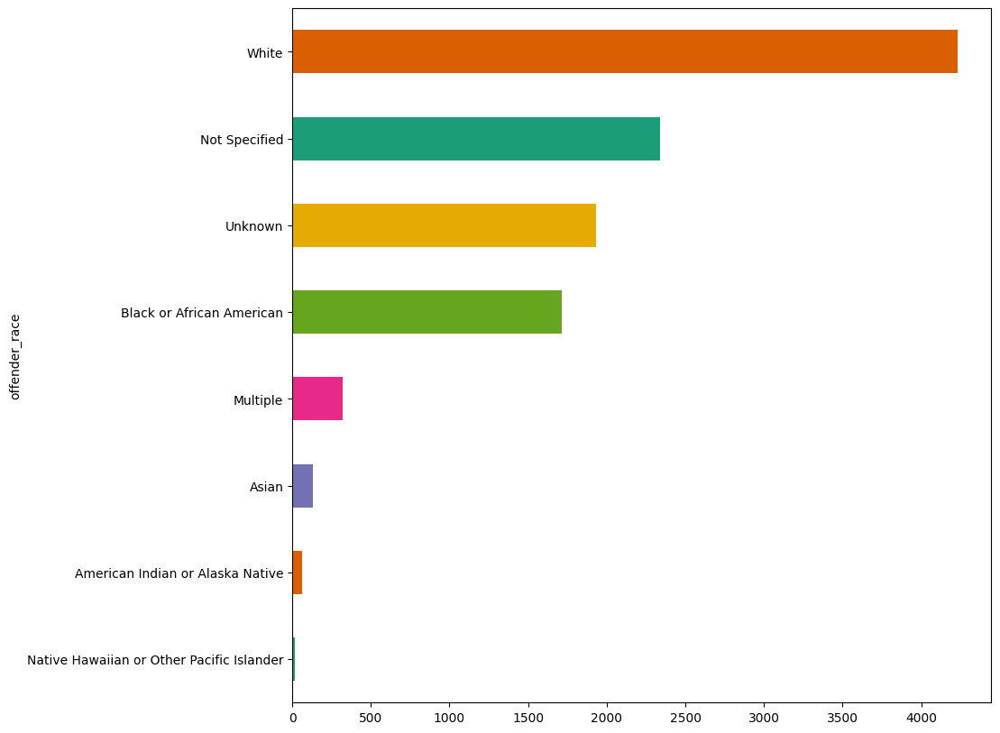

In [53]:
crime_df.groupby('offender_race').size().sort_values(ascending=True).plot.barh(color=sns.palettes.mpl_palette('Dark2'), figsize=(10,10))

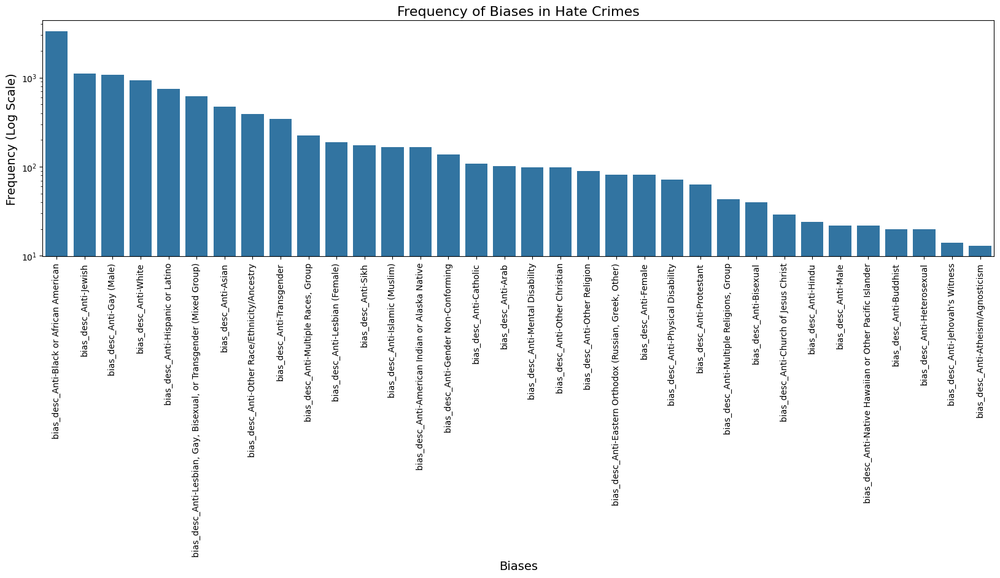

In [54]:
plot_column_counts(crime_df, "bias_desc", bias_cols, "Biases")

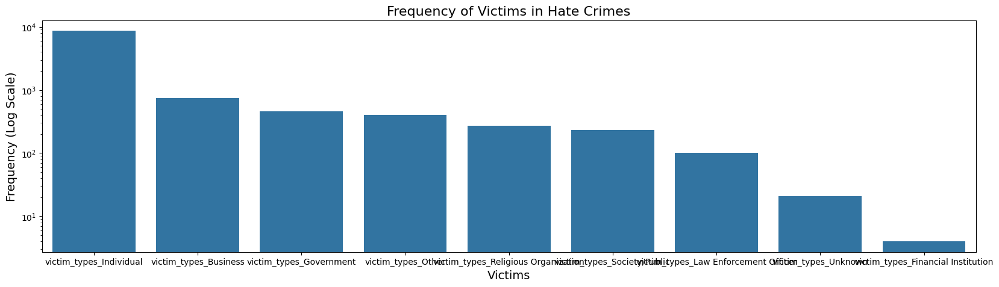

In [55]:
figsize=(20, 5)
plot_column_counts(crime_df, "victim_types", victim_cols, "Victims", figsize, 0)

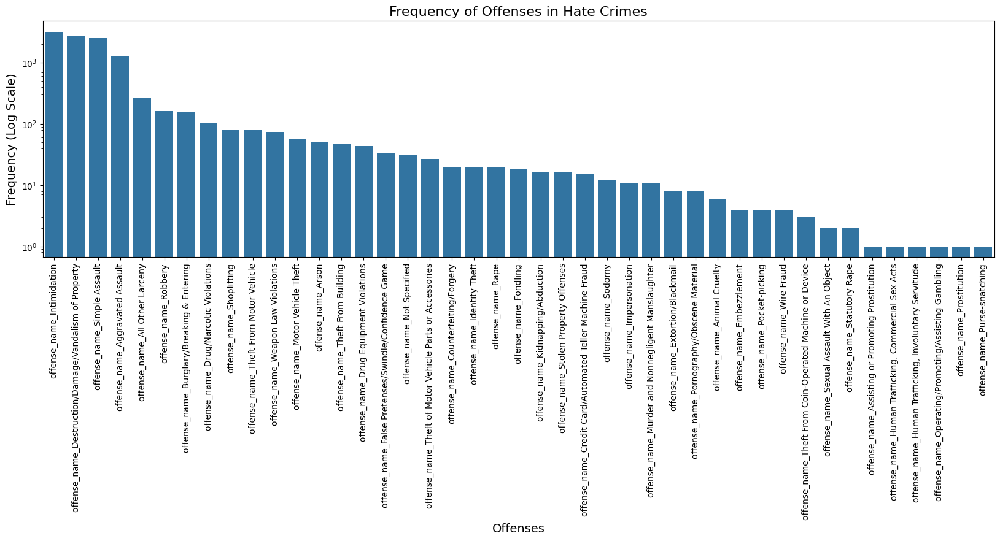

In [56]:
plot_column_counts(crime_df, "offense_name", offense_cols, "Offenses")

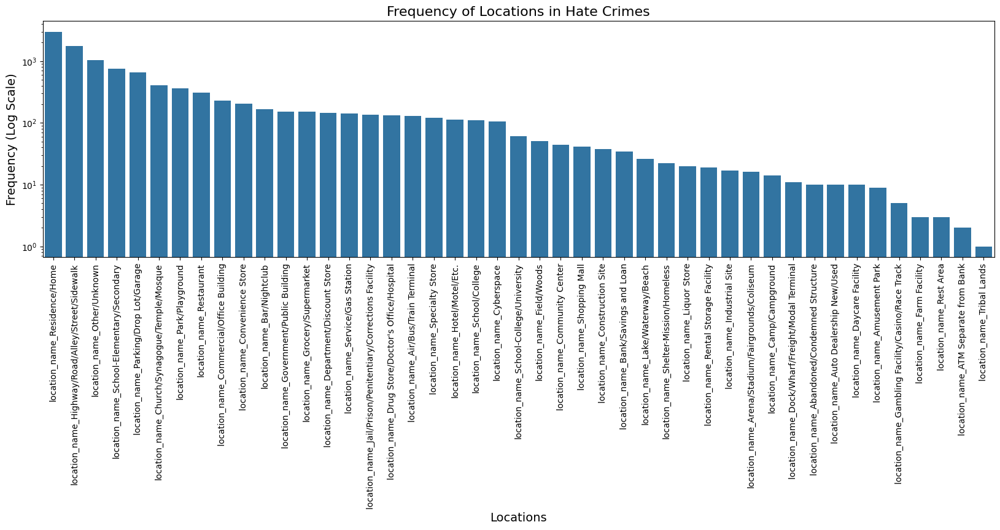

In [57]:
plot_column_counts(crime_df, "location_names", location_cols, "Locations")

####Geographic heat maps

In [58]:
ignore_list = ["Not Specified", "Unknown", "Multiple"]

Text(70.7222222222222, 0.5, 'Offender Race')

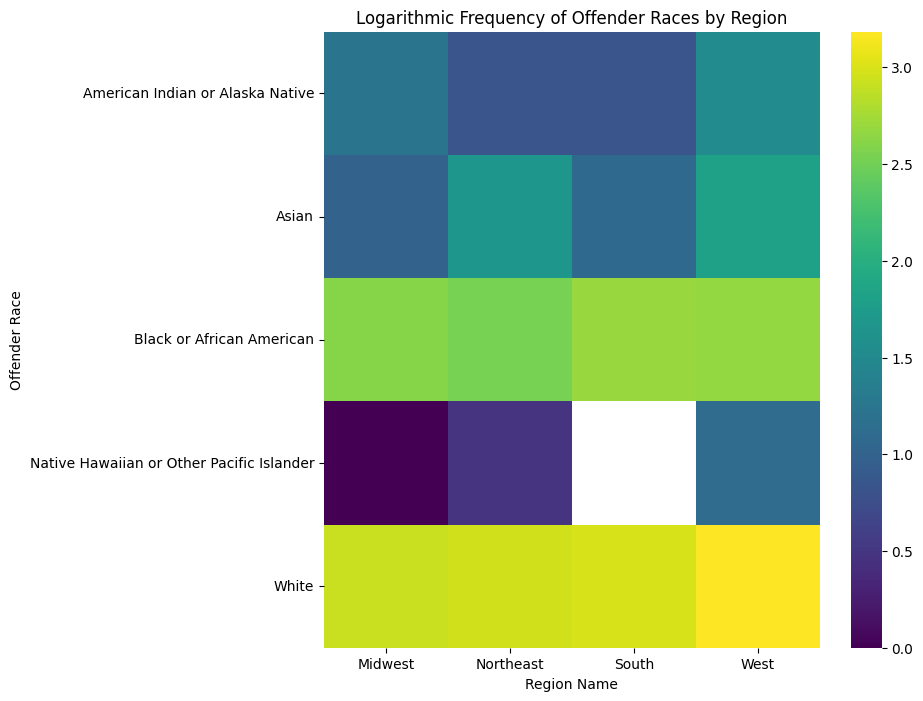

In [59]:
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['offender_race'].value_counts()
    for x_label, grp in crime_df.groupby('region_name')
})

# Drop less relevant columns for easier comparison with victim race heatmap
for item in ignore_list:
  df_2dhist.drop(item, inplace=True)

# Apply logarithmic transformation to the counts
df_2dhist_log = df_2dhist.applymap(lambda x: 0 if x == 0 else np.log10(x))

sns.heatmap(df_2dhist_log, cmap='viridis')
plt.title("Logarithmic Frequency of Offender Races by Region")
plt.xlabel("Region Name")
plt.ylabel("Offender Race")

In [60]:
# Get some victim races to start with
unique_offender_races = crime_df['offender_race'].unique().tolist()

# Drop categories absent from victim data
for item in ignore_list:
  unique_offender_races.remove(item)

unique_victim_races = ["bias_desc_Anti-" + str(race) for race in unique_offender_races]

print(unique_victim_races)

['bias_desc_Anti-American Indian or Alaska Native', 'bias_desc_Anti-White', 'bias_desc_Anti-Black or African American', 'bias_desc_Anti-Asian', 'bias_desc_Anti-Native Hawaiian or Other Pacific Islander']


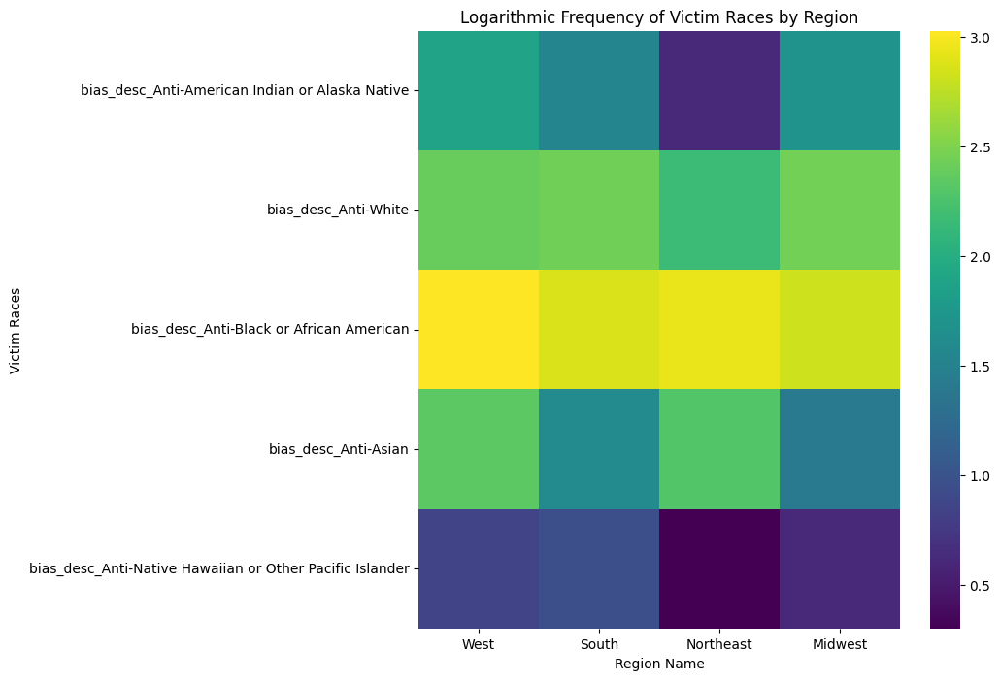

In [61]:
plt.subplots(figsize=(8, 8))

# Initialize an empty DataFrame with the correct index and columns
df_2dhist = pd.DataFrame(index=unique_victim_races, columns=crime_df['region_name'].unique())

# Iterate over each region and calculate the value counts for each victim race
for region in df_2dhist.columns:
    region_data = crime_df[crime_df['region_name'] == region]

    for victim_race in unique_victim_races:
        # Sum of occurrences of victim_race in the region
        count = region_data[victim_race].sum()
        # Update the DataFrame cell with the count
        df_2dhist.loc[victim_race, region] = count

# Convert DataFrame entries to numeric type and drop nan values
df_2dhist = df_2dhist.apply(pd.to_numeric)

# Apply logarithmic transformation to the counts
df_2dhist = df_2dhist.applymap(lambda x: 0 if x == 0 else np.log10(x))

# Create the heatmap with logarithmic scale
sns.heatmap(df_2dhist, cmap='viridis')

# Give the plot a title and axis labels
plt.title("Logarithmic Frequency of Victim Races by Region")
plt.xlabel("Region Name")
plt.ylabel("Victim Races")
plt.yticks(rotation=0)

plt.show()

####Correlation matrix

In [63]:
crime_numerical_columns = list(crime_df.select_dtypes(include=['int64', 'float64']).columns)
for item in ['level_0', 'index', 'incident_id', 'data_year']:
  if item in crime_numerical_columns:
    crime_numerical_columns.remove(item)

In [64]:
# Create a correlation matrix
crime_corr = crime_df[crime_numerical_columns].dropna().corr()

In [ ]:
# Set the figure size
plt.figure(figsize=(200, 100))

# Create a heatmap of the correlation matrix
sns.heatmap(crime_corr, annot=True)

# Show the plot
plt.show()

###City Demographics Dataset

####Correlation matrix

In [ ]:
city_numerical_cols = list(city_demo_df.select_dtypes(include=["int64", "float64"]).columns)

In [ ]:
# Create a correlation matrix
city_corr = city_demo_df[city_numerical_cols].corr()

In [ ]:
# Set the figure size
plt.figure(figsize=(80, 40))

# Create a heatmap of the correlation matrix
sns.heatmap(city_corr, annot=True)

# Show the plot
plt.show()

####Other figures

In [ ]:
city_demo_df.plot.scatter(x='20 to 24 years', y='75 to 84 years', logx=True, logy=True, s=40, alpha=.8, figsize=(16,8))

In [ ]:
city_demo_df['Total population'].plot.hist(bins=20, title='Total population', logy=True, figsize=(15,5))

In [ ]:
city_demo_df[age_groups].mean().plot.bar(logy=True, figsize=(20,5))
plt.xlabel('Age Group')
plt.ylabel('Mean Population')
plt.title('Mean Population by Age Group in City Demographics')
plt.xticks(rotation=0)
plt.show()

###County Demographics Dataset

In [68]:
county_demo_df.head()

NameError: name 'couty_demo_df' is not defined

####Correlation matrix

In [65]:
county_numerical_cols = list(county_demo_df.select_dtypes(include=["int64", "float64"]).columns)

In [66]:
# Create a correlation matrix
county_corr = county_demo_df[county_numerical_cols].corr()

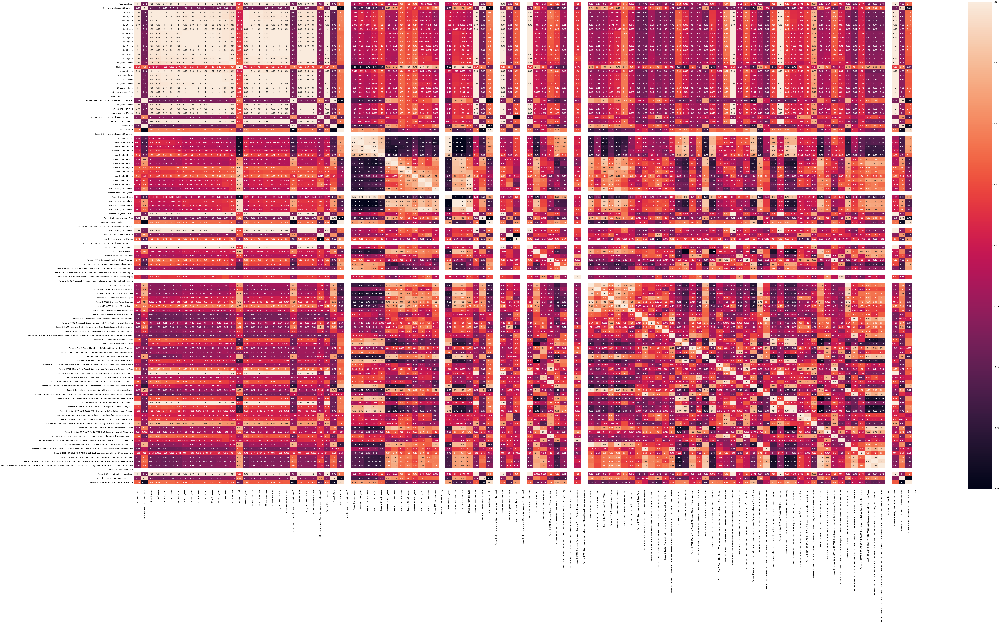

In [67]:
# Set the figure size
plt.figure(figsize=(100, 50))

# Create a heatmap of the correlation matrix
sns.heatmap(county_corr, annot=True)

# Show the plot
plt.show()

####Other figures

<Axes: xlabel='Under 5 years', ylabel='85 years and over'>

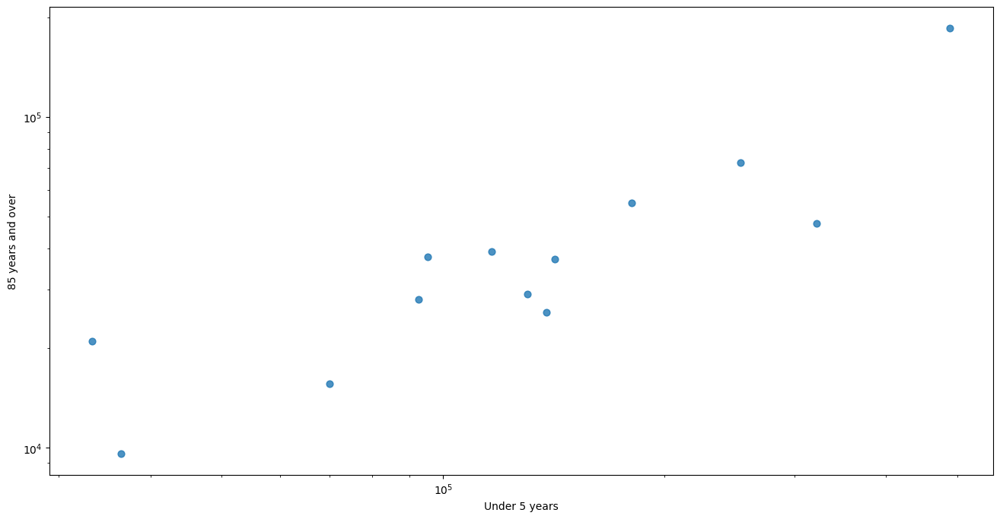

In [69]:
county_demo_df.plot.scatter(x='Under 5 years', y='85 years and over', logx=True, logy=True, s=40, alpha=.8, figsize=(16,8))

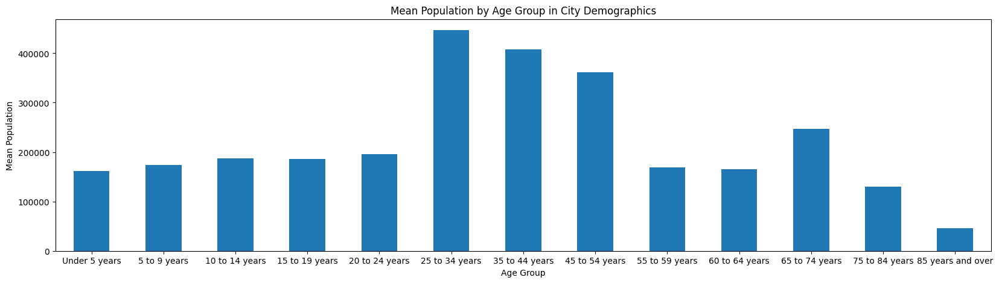

In [70]:
county_demo_df[age_groups].mean().plot.bar(figsize=(20,5))
plt.xlabel('Age Group')
plt.ylabel('Mean Population')
plt.title('Mean Population by Age Group in City Demographics')
plt.xticks(rotation=0)
plt.show()

##Merged Dataset

In [71]:
merged_df.head()

,index,incident_id,data_year,region_name,adult_victim_count,juvenile_victim_count,total_offender_count,adult_offender_count,juvenile_offender_count,victim_count,offense_name,total_individual_victims,incident_month,incident_day,bias_desc_Anti-American Indian or Alaska Native,bias_desc_Anti-Arab,bias_desc_Anti-Asian,bias_desc_Anti-Atheism/Agnosticism,bias_desc_Anti-Bisexual,bias_desc_Anti-Black or African American,bias_desc_Anti-Buddhist,bias_desc_Anti-Catholic,bias_desc_Anti-Church of Jesus Christ,"bias_desc_Anti-Eastern Orthodox (Russian, Greek, Other)",bias_desc_Anti-Female,bias_desc_Anti-Gay (Male),bias_desc_Anti-Gender Non-Conforming,bias_desc_Anti-Heterosexual,bias_desc_Anti-Hindu,bias_desc_Anti-Hispanic or Latino,bias_desc_Anti-Islamic (Muslim),bias_desc_Anti-Jehovah's Witness,bias_desc_Anti-Jewish,bias_desc_Anti-Lesbian (Female),"bias_desc_Anti-Lesbian, Gay, Bisexual, or Transgender (Mixed Group)",bias_desc_Anti-Male,bias_desc_Anti-Mental Disability,"bias_desc_Anti-Multiple Races, Group","bias_desc_Anti-Multiple Religions, Group",bias_desc_Anti-Native Hawaiian or Other Pacific Islander,bias_desc_Anti-Other Christian,bias_desc_Anti-Other Race/Ethnicity/Ancestry,bias_desc_Anti-Other Religion,bias_desc_Anti-Physical Disability,bias_desc_Anti-Protestant,bias_desc_Anti-Sikh,bias_desc_Anti-Transgender,bias_desc_Anti-White,victim_types_Business,victim_types_Financial Institution,victim_types_Government,victim_types_Individual,victim_types_Law Enforcement Officer,victim_types_Other,victim_types_Religious Organization,victim_types_Society/Public,victim_types_Unknown,offense_name_Aggravated Assault,offense_name_All Other Larceny,offense_name_Animal Cruelty,offense_name_Arson,offense_name_Assisting or Promoting Prostitution,offense_name_Burglary/Breaking & Entering,offense_name_Counterfeiting/Forgery,offense_name_Credit Card/Automated Teller Machine Fraud,offense_name_Destruction/Damage/Vandalism of Property,offense_name_Drug Equipment Violations,offense_name_Drug/Narcotic Violations,offense_name_Embezzlement,offense_name_Extortion/Blackmail,offense_name_False Pretenses/Swindle/Confidence Game,offense_name_Fondling,"offense_name_Human Trafficking, Commercial Sex Acts","offense_name_Human Trafficking, Involuntary Servitude",offense_name_Identity Theft,offense_name_Impersonation,offense_name_Intimidation,offense_name_Kidnapping/Abduction,offense_name_Motor Vehicle Theft,offense_name_Murder and Nonnegligent Manslaughter,offense_name_Not Specified,offense_name_Operating/Promoting/Assisting Gambling,offense_name_Pocket-picking,offense_name_Pornography/Obscene Material,offense_name_Prostitution,offense_name_Purse-snatching,offense_name_Rape,offense_name_Robbery,offense_name_Sexual Assault With An Object,offense_name_Shoplifting,offense_name_Simple Assault,offense_name_Sodomy,offense_name_Statutory Rape,offense_name_Stolen Property Offenses,offense_name_Theft From Building,offense_name_Theft From Coin-Operated Machine or Device,offense_name_Theft From Motor Vehicle,offense_name_Theft of Motor Vehicle Parts or Accessories,offense_name_Weapon Law Violations,offense_name_Wire Fraud,location_name_ATM Separate from Bank,location_name_Abandoned/Condemned Structure,location_name_Air/Bus/Train Terminal,location_name_Amusement Park,location_name_Arena/Stadium/Fairgrounds/Coliseum,location_name_Auto Dealership New/Used,location_name_Bank/Savings and Loan,location_name_Bar/Nightclub,location_name_Camp/Campground,location_name_Church/Synagogue/Temple/Mosque,location_name_Commercial/Office Building,location_name_Community Center,location_name_Construction Site,location_name_Convenience Store,location_name_Cyberspace,location_name_Daycare Facility,location_name_Department/Discount Store,location_name_Dock/Wharf/Freight/Modal Terminal,location_name_Drug Store/Doctor's Office/Hospital,location_name_Farm Facility,location_name_Field/Woods,location_name_Gambling Facility/Casino/Race Track,location_name_Government/Public Building,location_name_Grocery/Super

###Correlation Matrix Analysis

In [72]:
#convert the categorical columns to numerical ones and store the modified df as a new df for correlation analysis
categorical_to_int_df = merged_df
# Select only the numerical columns
numerical_cols = categorical_to_int_df.select_dtypes(include=['int64', 'float64', np.number]).drop(labels=["incident_id"], axis=1)
# numerical_cols

In [73]:
# Create a correlation matrix
merged_corr = merged_df[int_columns].dropna().corr()

###Correlation matrix preprocessing

In [74]:
# Unstack and rename merged_corr
merged_corr_sorted = pd.DataFrame(merged_corr.unstack()).reset_index()
merged_corr_sorted.rename(columns={"level_0":"feature1", "level_1":"feature2", 0:"corr"}, inplace=True)
merged_corr_sorted.head()

,feature1,feature2,corr
0,Total population,Total population,1.000000
1,Total population,Under 5 years,0.997214
2,Total population,5 to 9 years,0.996742
3,Total population,45 to 54 years,0.948936
4,Total population,10 to 14 years,0.998685


In [75]:
merged_corr_sorted["abs_corr"] = 0

# Get highest correlation coefficient pairs
merged_corr_sorted["abs_corr"] = merged_corr_sorted["corr"].abs()
merged_corr_sorted.sort_values(by="abs_corr", ascending=False, inplace=True)

#reset the indices
merged_corr_sorted.reset_index(inplace=True)

merged_corr_sorted.head()

,index,feature1,feature2,corr,abs_corr
0,0,Total population,Total population,1.0,1.0
1,25200,location_name_Construction Site,location_name_Construction Site,1.0,1.0
2,17775,offense_name_Murder and Nonnegligent Manslaughter,offense_name_Murder and Nonnegligent Manslaughter,1.0,1.0
3,17550,offense_name_Motor Vehicle Theft,offense_name_Motor Vehicle Theft,1.0,1.0
4,17325,offense_name_Kidnapping/Abduction,offense_name_Kidnapping/Abduction,1.0,1.0


In [76]:
# remove coefficients that represent variables' correlations with themselves
merged_corr_sorted = merged_corr_sorted[~(merged_corr_sorted["feature1"] == merged_corr_sorted["feature2"])]

<Axes: title={'center': 'Correlation Coefficient Frequency Distribution'}, ylabel='Frequency'>

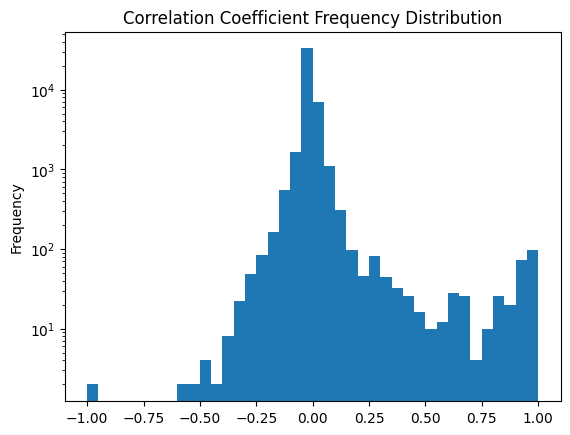

In [77]:
merged_corr_sorted['corr'].plot.hist(bins=40, title='Correlation Coefficient Frequency Distribution', logy=True)

<Axes: title={'center': 'Absolute Correlation Coefficient Frequency Distribution'}, ylabel='Frequency'>

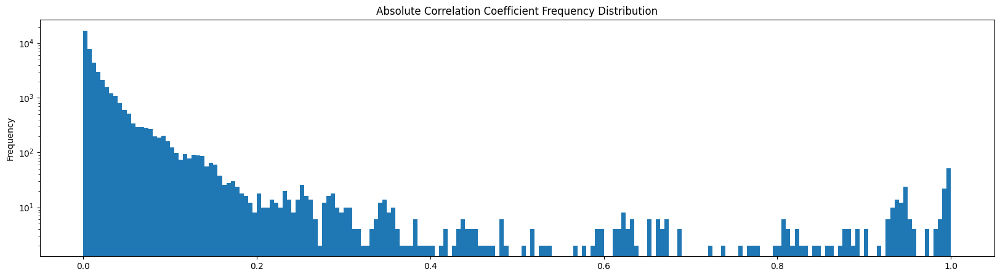

In [78]:
merged_corr_sorted['abs_corr'].plot.hist(bins=200, title='Absolute Correlation Coefficient Frequency Distribution', logy=True, figsize=(20, 5))

In [85]:
# drop half the entries, which are essentially duplicates,
#   as well as any np.nan entries and entries with low correlation coefficients or exceedingly high correlation coefficients,
#   which have already been considered previously or present trivial correlation information
#   (ie the number of individuals under 5 years of age is directly correlated with the total population)
merged_corrs_of_interest = merged_corr_sorted[(merged_corr_sorted.index % 2 == 0) & (merged_corr_sorted["abs_corr"] > 0.2) & (merged_corr_sorted["abs_corr"] < 0.84)]

In [86]:
# Drop merged_corrs_of_interest entries that have "state_name" in feature1 or feature2
merged_corrs_of_interest = merged_corrs_of_interest[~merged_corrs_of_interest["feature1"].str.contains("state_name|Other|Unknown")]
merged_corrs_of_interest = merged_corrs_of_interest[~merged_corrs_of_interest["feature2"].str.contains("state_name|Other|Unknown")]

In [87]:
merged_corrs_of_interest

,index,feature1,feature2,corr,abs_corr
430,1269,75 to 84 years,division_name_Middle Atlantic,0.778577,0.778577
436,24470,location_name_Church/Synagogue/Temple/Mosque,victim_types_Religious Organization,0.758907,0.758907
438,22007,offense_name_Weapon Law Violations,victim_types_Society/Public,0.739289,0.739289
444,33388,division_name_Middle Atlantic,65 to 74 years,0.688493,0.688493
446,33377,division_name_Middle Atlantic,Under 5 years,0.674078,0.674078
448,1717,25 to 34 years,division_name_Middle Atlantic,0.672413,0.672413
450,3061,85 years and over,division_name_Middle Atlantic,0.670851,0.670851
452,33387,division_name_Middle Atlantic,55 to 59 years,0.666294,0.666294
456,1493,60 to 64 years,division_name_Middle Atlantic,0.663305,0.663305
458,597,5 to 9 years,division_name_Middle Atlantic,0.660862,0.660862


In [ ]:
merged_corrs_of_interest['corr'].plot.hist(bins=100, title='Frequency of potentially interesting correlation coefficients', logy=True, figsize=(10, 2))

In [ ]:
# merged_corrs_of_interest.drop(columns=["abs_corr"])

###Other figures

In [ ]:
# merged_df["color"] = merged_df["region_name"].map({
#     "Midwest": "red",
#     "West": "yellow",
#     "Northeast": "green",
#     "South": "blue"
# })
# merged_df["size"] = merged_df.groupby(["incident_month", "region_name"]).count().reset_index()["incident_id"]

# #remove the max row limit for altair
# alt.data_transformers.disable_max_rows()

# alt.Chart(merged_df.dropna()).mark_circle().encode(
#     x="total_offender_count",
#     y="total_individual_victims",
#     color=alt.Color("color", scale=None),
#     size="size"
# )